# Multilayer Perceptron in PyTorch

## Introduction

### Goal
Learn the basics of PyTorch (PT) by working on an artificial classification problem.

### Plan
In this tutorial we will create a set of synthetic data that we will use as an example problem.
Then we will create a MLP model and learn its parameters from the data. Finally we will visualize the different learning measures and the parameters of the model.

In a second part we will modify our data and adapt the hyper-parameters (e.g. number of hidden neurons) of our model to allow better classification.

In the next part we will use the basic functions of PT to understand our process and how PT works. But we will also mention the high level features and aids of PT that facilitate our tasks.


### Usage
 
 * Respond to exercices in the next cells.
 * Write your code in between the lines:
 
```
### BEGIN SOLUTION


### END SOLUTION
```

 * You will provide this same notebook completed for assessment.

### Requirements

Python >=3.5

Modules python:
- pytorch >=1.0
- numpy
- matplotlib

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## 1. Data generation

In this part, we will generate a data set of 1000 points which is not linearly separable.

#### Create the artificial data sets

## Exercise 1

Create 1000 points of 2 dimensions $(x_0, x_1)$ with their coordinates between 0 et 1 $x_0, x_1 \in [0, 1]$.


## Exercise 2

Assign to each point a binary class $y$ (0 ou 1) following the condition: 
$$
y = \begin{cases}
1 &\text{if $x_0 > 0.2$ et $x_1 > 0.4$}\\
0 &\text{else}
\end{cases}
$$

## Exercise 3

Create a matrix of data `data` with shape `(1000, 3)` with a point per row, the two first columns contain the points coordinates $(x_0, x_1)$ the last column contains the class $y$.

## Exercise 4

Split the data into 3 sets (on matrix for each): 800 points for `train`, 100 points for `valid` and 100 for `test`

## Exercise 5

Visualise the data using a scatter plot (`plt.scatter`).


We expect to find something similar to this:

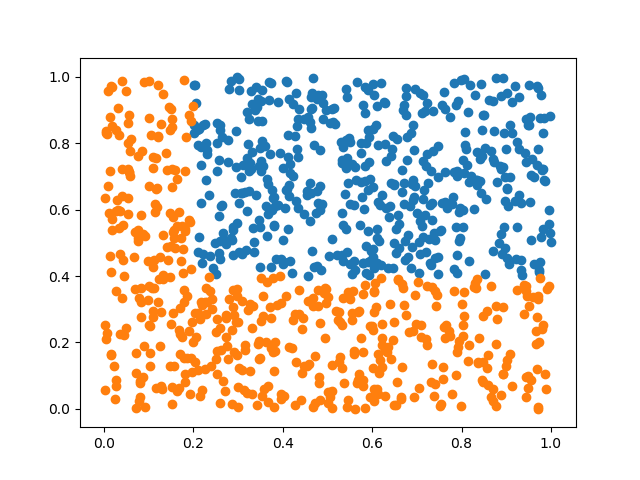

torch.Size([1000, 3])
torch.Size([800, 3]) torch.Size([100, 3]) torch.Size([100, 3])


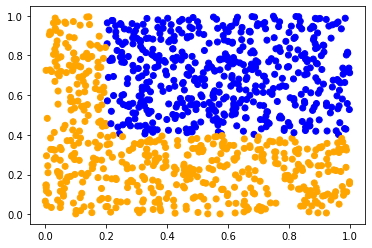

In [2]:
# Generate, split and plot the data
### BEGIN SOLUTION

#exercise 1
data = torch.rand(1000,2)

#exercise 2
y = torch.unsqueeze(torch.FloatTensor([ 1 if 0.2 < x[0] and x[1] > 0.4 else 0 for x in data]),1)

#exercise 3
data = torch.cat((data,y), dim=1)
print(data.shape)

#exercise 4
train = data[:800]
valid = data[800:900]
test = data[900:]
print(train.shape, valid.shape, test.shape)

#exercise 5
color = ['blue' if x==1.0 else 'orange' for x in data[:,2]]
plt.scatter(data[:,0], data[:,1], c =color)
plt.show()

### END SOLUTION

**Run the following cell to make sure you have done the previous exercises correctly.**

In [3]:
# Verification des dimensions des donnees
assert data.shape == (1000, 3)

# Verification des division desd donnees
assert train.shape == (800, 3)
assert valid.shape == (100, 3)
assert test.shape == (100, 3)

for dataset in [train, valid, test]:
    # Verification des classes
    assert (dataset[dataset[:,-1]==1,0] > 0.2).all()
    assert (dataset[dataset[:,-1]==1,1] > 0.4).all()
    assert ((dataset[dataset[:,-1]==0,0] <= 0.2) | (dataset[dataset[:,-1]==0,1] <= 0.4)).all()
    
print('Everything looks good!')

Everything looks good!


## 2. Create the model
In this part, we will create, with PyTorch, a model to predict the class $y$ of a point using only its coordinates $(x_0, x_1)$.

The model we will create to classify the data is a Multilayer Perceptron with a single hidden layer:

\begin{align}
h_1 &= \sigma(x W_1 + b_1) \\
\hat{y} &= \sigma(h_1 W_2 + b_2) \\
& \textrm{ avec } & \\
\sigma(t) &= \frac{1}{1+e^{-t}}
\end{align}

$\hat{y}$ will the model's estimation for the class of the point.

## Exercise 6
What are the model parameters?


**Answer:** The model parameters are the weights and the biases for every perceptron as follows:
1. $W_1$ is the weight vector of hidden layer 1 for x.
2. $b_1$ is the bias for the hidden layer 1.
3. $W_2$ is the weight vector of output layer for h.
4. $b_2$ is the bias for the output layer.  

### Implementation en PyTorch

First we will do a low level implementation where we will only use the AutoDiff feature (which allows to automatically compute gradients) of PyTorch.

PyTorch has an API similar to numpy. The big difference being that for the symbols for which we want to have a gradient, we have to include the argument named `requires_grad = True`.

For example $W_1$ is a parameter of the model and we are interested in the gradient of the loss with respect to this symbol. So at initialization time we will add `requires_grad=True`.

## Exercise 7

What the dimensions of each of these symbols: $x, y, W_1, b_1, W_2, b_2$?


**Answer:** The dimensions are given below:
<ul>
 <li> $x:(1,2)$
 <li> $y: (1,1)$
 <li> $W_1: (2,2)$
 <li> $b_1:(1,2)$
 <li> $W_2:(2,1)$
 <li> $b_2: (1,1)$
</ul> 



## Exercise 8
Create a function that initializes and returns a tuple with the MLP  parameters.


In [20]:
# Create the model
def init_mlp(n_input, n_hidden, n_output):    
    ### BEGIN SOLUTION
    w1 = torch.rand(n_input, n_hidden,requires_grad=True)
    b1 = torch.zeros(1, n_hidden, requires_grad=True)
    w2 = torch.rand(n_hidden, n_output, requires_grad=True)
    b2 = torch.zeros(1,n_output, requires_grad=True)
    params = (w1,b1,w2,b2)
    ### END SOLUTION
    return params
    
params = init_mlp(2, 2, 1)
print(params)

(tensor([[0.1401, 0.2312],
        [0.7380, 0.4831]], requires_grad=True), tensor([[0., 0.]], requires_grad=True), tensor([[0.8854],
        [0.2740]], requires_grad=True), tensor([[0.]], requires_grad=True))


### Run a forward pass of the model on the following data points

## Exercise 8
What is the desired response for the following points?
$$(0.1, 0.5), (0.3, 0.5), (0.3, 0.15), (0.1, 0.15)$$



**Answer:** We have gotten the $W_1$, $b_1$, $W_2$, and $b_2$ as follows;

\begin{align}W_1 = \begin{bmatrix}
0.14 & 0.23\\
0.74 & 0.48
\end{bmatrix},
b_1 = \begin{bmatrix}
0 & 0
\end{bmatrix},
W_2 = \begin{bmatrix}
0.89\\
0.27
\end{bmatrix},
b_2 = \begin{bmatrix}
0
\end{bmatrix}
\end{align}

Following equations will compute the output of our MLP;
\begin{align}
h_{11} = σ(x_1*w_{11}^1+x_2*w_{21}^1+b_{11}^1)\\
h_{12} = σ(x_1*w_{12}^1+x_2*w_{22}^1+b_{12}^1)\\
\hat{y} = σ(h_{11}*w_{11}^2+h_{12}*w_{12}^2+b_{11}^2)
\end{align}

for (0.1,0.5):
\begin{align}
h_{11} = σ(0.1*0.14+0.5*0.74+0) = 0.59\\
h_{12} = σ(0.1*0.23+0.5*0.48+0) = 0.57\\
\hat{y} = σ(0.59*0.89+0.57*0.27+0) = 0.66
\end{align}

for (0.3,0.5):
\begin{align}
h_{11} = σ(0.3*0.14+0.5*0.74+0) = 0.60\\
h_{12} = σ(0.3*0.23+0.5*0.48+0) = 0.58\\
\hat{y} = σ(0.60*0.89+0.58*0.27+0) = 0.67
\end{align}

for (0.3,0.15):
\begin{align}
h_{11} = σ(0.3*0.14+0.15*0.74+0) = 0.54\\
h_{12} = σ(0.3*0.23+0.15*0.48+0) = 0.54\\
\hat{y} = σ(0.54*0.89+0.54*0.27+0) = 0.65
\end{align}

for (0.1,0.15):
\begin{align}
h_{11} = σ(0.1*0.14+0.15*0.74+0) = 0.53\\
h_{12} = σ(0.1*0.23+0.15*0.48+0) = 0.52\\
\hat{y} = σ(0.53*0.89+0.52*0.27+0) = 0.65
\end{align}

Therefore, the desired response would be 0.66, 0.67, 0.65, and 0.65.

**N.B.** Calculation is in the next cell.


In [44]:
def sigmoid(t):
  return 1/(1+torch.exp(-t))

def cal(x1, x2):
  h1 = sigmoid(torch.tensor(x1*0.14+x2*0.74+0))
  h2 = sigmoid(torch.tensor(x1*0.23+x2*0.48+0))
  y_hat = sigmoid(torch.tensor(h1.item()*0.89+h2.item()*0.27+0))
  print("h1=",round(h1.item(),2)," h2=",round(h2.item(),2)," y=",round(y_hat.item(),2))

cal(0.1,0.5)
cal(0.3,0.5)
cal(0.3,0.15)
cal(0.1,0.15)

h1= 0.59  h2= 0.57  y= 0.66
h1= 0.6  h2= 0.58  y= 0.67
h1= 0.54  h2= 0.54  y= 0.65
h1= 0.53  h2= 0.52  y= 0.65


## Exercise 9
Execute the model on the previous points and print $\hat{y}$


In [38]:
### BEGIN SOLUTION  
# Create a function sigmoid(t) that computes the sigmoid function on t
def sigmoid(t):
  return 1/(1+torch.exp(-t))
# Create a function mlp(x, params) that computes the MLP outputs given the inputs x
def mlp(x, params):
  a1 = x@params[0]+params[1]
  h1 = sigmoid(a1)
  a2 = h1@params[2]+params[3]
  y_hat = sigmoid(a2)
  return y_hat
# Create a tensor containing the previous points
x = torch.tensor([[0.1,0.5],[0.3,0.5],[0.3,0.15],[0.1,0.15]])
# Call and print output of mlp(points, params) (NOTE: use torch.no_grad())
with torch.no_grad():
  print(mlp(x,params))
### END SOLUTION

tensor([[0.6641],
        [0.6661],
        [0.6509],
        [0.6488]])


So the values are exactly same as we have calculated above. Therefore, our model is working fine.

In [46]:
x = torch.tensor([[2.0, 3.0], [2.0, 1.0]])
W1 = torch.tensor([[1.0, 2.0], [3.0, 4.0]])
b1 = torch.tensor([[0.0, 0.0]])
W2 = torch.tensor([[1.0], [2.0]])
b2 = torch.tensor([[0.0]])
with torch.no_grad():
  print(mlp(x,(W1,b1,W2,b2)))

tensor([[0.9526],
        [0.9522]])


In [56]:
h = torch.tensor([[0.1, 0.5], [0.1, 0.5]])@torch.tensor([[0.14, 0.23], [0.74, 0.48]]) + torch.tensor([1.0, 1.0])
print(h.shape)

torch.Size([2, 2])


We can observe that the results are not good, because they are far from the expected result.

If we want to compute on our test data the performance of the model we will define an accuracy function, which takes a decision for each data based on $\hat{y}$ and compares it to $y$.

$$
\text{accuracy} = \frac{1}{N} \sum_i^N (1 - abs(y - round(\hat{y}_i))) 
$$

The accuracy represents the rate of correctly classified points. It will be $1$ if all points are correctly classified, $0$ if all are misclassified and $0.5$ if half are well classified.

## Exercise 10

Implement the accuracy using Pytorch functions `torch.mean`, `torch.abs`, `torch.round`.


In [57]:
def accuracy(estimated, reference):
    ### BEGIN SOLUTION
    return torch.mean(1 - (torch.abs(reference - torch.round(estimated))))
    ### END SOLUTION

## Exercise 11

Evaluate and print the score on the `train` set


In [58]:
def score_model(params, data):
    ### BEGIN SOLUTION
    with torch.no_grad():
      estimated = mlp(data[:,:2],params)
      return accuracy(estimated,data[:,2:]).item()
    ### END SOLUTION

print(score_model(params, train))

0.5037500262260437


## Exercise 12
Do the same with `valid` and `test`


In [60]:
### BEGIN SOLUTION
print(f'score valid: {score_model(params, valid)}')
print(f'score test: {score_model(params, test)}')
### END SOLUTION

score valid: 0.5699999928474426
score test: 0.4399999976158142


## Exercise 13

Explain the results.

**Answer:** For the validation set the model prediction gets around 56% accuracy and for the test set the accuracy is 43%.

Accuracy is very low because the model is not trained yet. We have just assigned all the weights parameters randomly and biases are zero.

Therefore, accuracy is also random.

## 4. Training the model

To find the best parameters for our model we will enter it with the training data. For this we will define a cost function to optimize.

As we are trying to solve a binary classification task, we will use the crossentropy cost function:

$$
\mathcal{L} = \sum -y \log(\hat{y}) - (1-y) \log(1-\hat{y})
$$

## Exercise 14
Implement the cost function in PyTorch.


In [9]:
def bce(est, ref):
    ### BEGIN SOLUTION
    return torch.sum( - ref * torch.log(est) - (1 - ref) * torch.log(1 - est))
    ### END SOLUTION

To train our model by means of Gradient Descent (GD) we will iteratively update with small increments our parameters:

\begin{align}
W_1^n &= W_1^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta W_1} \\
b_1^n &= b_1^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta b_1} \\
W_2^n &= W_2^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta W_2} \\
b_2^n &= b_2^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta b_2}
\end{align}

Where $\eta$ is our learning rate.

We need to calculate the gradients:
$$
\frac{\delta \mathcal{L}}{\delta W_1}, \frac{\delta \mathcal{L}}{\delta b_1}, \frac{\delta \mathcal{L}}{\delta W_2}, \frac{\delta \mathcal{L}}{\delta b_2}
$$

For the gradients of the cost function with respect to the parameters, we could calculate them by hand. But we are lazy. So we will use PyTorch `error.backward()` will do this for us in an optimized way using Dynamic Programming (DP) and populate the tensors with the gradients.

Finally we will run a training of 10 `epochs` with a `batch_size=100`.
For this we will do the following steps:
1. Calculate the number of iterations (`n_iterations`) per epoch (remember that an iteration is an update of the parameters and an epoch is a competing use of all our training data)
2. Create a session
3. Initialize the variables
4. For each epoch (`for epoch in range(n_epochs):`)
    1. Randomly reorder the `train` data (use `torch.randperm()`)
    2. Evaluate and print the model score on the training data
    3. For each iteration (`for iteration in range(n_iterations):`)
        1. Select a block of `batch_size` examples
        2. Run the forward pass on the model (`mlp()`)
        3. Compute the loss (`bce()`)
        4. *Zero the gradients*
        5. Compute the gradients
        6. *Update the parameters doing gradient descent*

**Note 1:** Remember that PyTorch keeps track of all the operations you make with tensors to build the DAG graph. In some cases we want to avoid that, such as when setting the gradients to zero or performing the gradient descent update of the parameters. In those cases we may use `w1.data` or `w1.grad.data`.

**Note 2:** Zero the gradients means accessing the gradient of each parameter and setting it to zero. We need this because PyTorch `.backward()` method accumulates the gradients instead of replacing them.
    
## Exercise 15

Implement and run a train loop for the model.

In [61]:
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size # floor division
    
    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        # Randomly reorder the `train` data (use `torch.randperm()`)
        data = data[torch.randperm(n_data)]
        # Evaluate and print the model score on the training data
        if epoch%10 == 0:
          print(f"epoch: {epoch}")
          print(f"score (train): ", end = '')
          print(score_model(params, data))
        ### END SOLUTION    
        
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            # 1. Select a block of `batch_size` examples
            batch_data = data[iteration*batch_size:iteration*batch_size+batch_size]
            # 2. Run the forward pass on the model
            estimated = mlp(batch_data[:,:2],params)
            # 3. Compute the error
            loss = bce(estimated, batch_data[:,2:])
            # 4. Zero the gradients of each of the parameters because .bacward() accumulates them
            
            # 5. Compute the gradients
            loss.backward()
            
            # 6. Update the parameters using their gradients
            with torch.no_grad():
              for param in params:
                param.data -= eta * param.grad.data

            # We need to zero the gradients at the end and of course not before calling the backward()
            for param in params:
              param.grad.data.zero_()
            ### END SOLUTION

params = init_mlp(2, 2, 1)                    
train_model(params, train, eta=0.05, n_epochs=100)

epoch: 0
score (train): 0.5037500262260437
epoch: 10
score (train): 0.8199999928474426
epoch: 20
score (train): 0.8462499976158142
epoch: 30
score (train): 0.8324999809265137
epoch: 40
score (train): 0.8737499713897705
epoch: 50
score (train): 0.9787499904632568
epoch: 60
score (train): 0.9837499856948853
epoch: 70
score (train): 0.9850000143051147
epoch: 80
score (train): 0.9912499785423279
epoch: 90
score (train): 0.9925000071525574


## 5. Visualization of the model

To monitor the evolution of the learning of our model, we will visualize the value of the cost function, the classification score and the parameters of the first layer of our model.  

We will run our experiments with different values of the following hyperparameters to better understand their effect:
- `learning_rate`
- `batch_size`


### Visualization of the cost function

The cost function is the value we aim to reduce with the training iterations. To visualize it we will create an empty list (`couts = []`) at the beginning of our training and we will add (`couts.append(cout)`) the value resulting from the cost at each iteration. At the end of the training we will visualize the curve (`plt.plot(costs)`).

## Exercise 16
Rewrite the `train_model` function so that it returns the average loss of every epoch. Run it and plot the loss of a training procedure. While we are at it, make the printing optional with an additional keyword argument.

epoch: 0
score (train): 0.5037500262260437
epoch: 10
score (train): 0.84375
epoch: 20
score (train): 0.8700000047683716
epoch: 30
score (train): 0.9524999856948853
epoch: 40
score (train): 0.9725000262260437
epoch: 50
score (train): 0.9725000262260437
epoch: 60
score (train): 0.9837499856948853
epoch: 70
score (train): 0.9862499833106995
epoch: 80
score (train): 0.9887499809265137
epoch: 90
score (train): 0.9937499761581421


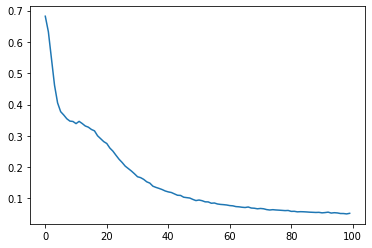

In [65]:
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16, verbose=False):
    losses = []

    ### BEGIN SOLUTION
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    
    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        # initialize the loss for each epoch
        losses.append(0)
        # Randomly reorder the `train` data (use `torch.randperm()`)
        data = data[torch.randperm(n_data)]
         # Evaluate and print the model score on the training data
        if epoch%10 == 0 and verbose:
          print(f"epoch: {epoch}")
          print(f"score (train): ", end = '')
          print(score_model(params, data))
        ### END SOLUTION    
        
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            # 1. Select a block of `batch_size` examples
            batch_data = data[iteration*batch_size:iteration*batch_size+batch_size]
            # 2. Run the forward pass on the model
            estimated = mlp(batch_data[:,:2],params)
            # 3. Compute the error
            loss = bce(estimated, batch_data[:,2:])
            losses[epoch] += loss.item()
            # 4. Zero the gradients of each of the parameters because .bacward() accumulates them
            
            # 5. Compute the gradients
            loss.backward()
            # 6. Update the parameters using their gradients
            with torch.no_grad():
              for param in params:
                param.data -= eta * param.grad.data

            # We need to zero the gradients at the end and of course not before calling the backward()
            for param in params:
              param.grad.data.zero_()
            ### END SOLUTION
        losses[epoch] /= (n_iterations*batch_size)  
    ### END SOLUTION
    return losses

params = init_mlp(2, 2, 1)                    
losses = train_model(params, train, eta=0.05, n_epochs=100, verbose=True)
plt.plot(losses)

### Effect of the learning rate

We will run our learning with different learning rates to see its effect on the cost function. To reduce the computational cost we will only evaluate the cost function at the end of each epoch.

## Exercise 17
Display the training loss curve for learning rates `[0.5, 0.05, 0.005, 0.0005]`

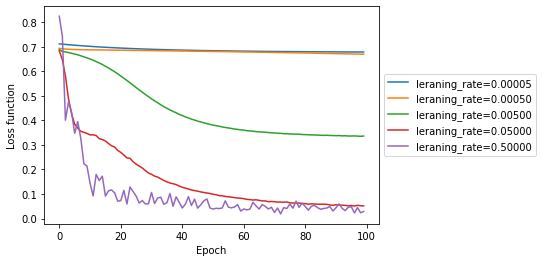

In [66]:
learning_rates = [0.5, 0.05, 0.005, 0.0005, 0.00005]
n_epochs = 100
batch_size = 16

losses = {}

# Train a model with each learning rate and populate losses with the learning rate as key and the loss series as values
### BEGIN SOLUTION
for lr in learning_rates:
  params = init_mlp(2, 2, 1)
  losses[lr] = train_model(params, train, lr, n_epochs, batch_size)
### END SOLUTION

plt.figure()
for lr, loss_curve in sorted(losses.items()):
    plt.plot(loss_curve, label=f'leraning_rate={lr:.5f}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');

Spend some times to think about these graphs. Can you figure out the relation between learning rate and each loss graph line? Can you visualize the relation betwwn gradient descent and learning rate?

### Effect of batch size

We will now run our training with different batch sizes to see its effect on the cost function. To reduce the computational cost we will only evaluate the cost function at the end of each epoch.

## Exercise 18

Display the cost function evaluated on all training data at each epoch for batch sizes `[n_data, 100, 50, 10, 5, 1]`


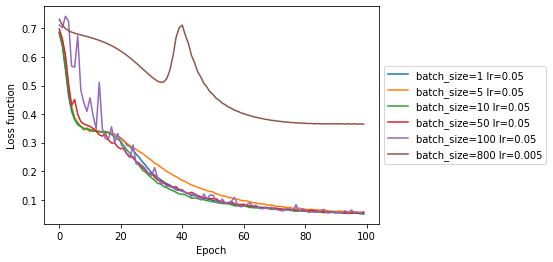

In [69]:
n_data = train.shape[0]

n_epochs = 100
batch_sizes = [n_data, 100, 50, 10, 5, 1]
lrs = [0.005, 0.05, 0.05, 0.05, 0.05, 0.05]

losses = {}

### BEGIN SOLUTION
for i, lr in enumerate(lrs):
  params = init_mlp(2, 2, 1)
  losses[(batch_sizes[i],lr)] = train_model(params, train, lr, n_epochs, batch_sizes[i])
### END SOLUTION

# Visualiser les courbes de cout
plt.figure()
for (bs, lr), loss_curve in sorted(losses.items()):
    plt.plot(loss_curve, label=f'batch_size={bs} lr={lr}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');

In [70]:
# Storing the classification accuracy on each epoch and return
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size # floor division
    
    accur = []
    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        accur.append(0)
        # Randomly reorder the `train` data (use `torch.randperm()`)
        data = data[torch.randperm(n_data)]
        # Evaluate and print the model score on the training data
        accur[epoch] += score_model(params, data)
        ### END SOLUTION    
        
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            # 1. Select a block of `batch_size` examples
            batch_data = data[iteration*batch_size:iteration*batch_size+batch_size]
            # 2. Run the forward pass on the model
            estimated = mlp(batch_data[:,:2],params)
            # 3. Compute the error
            loss = bce(estimated, batch_data[:,2:])
            # 4. Zero the gradients of each of the parameters because .bacward() accumulates them
            
            # 5. Compute the gradients
            loss.backward()
            
            # 6. Update the parameters using their gradients
            with torch.no_grad():
              for param in params:
                param.data -= eta * param.grad.data

            # We need to zero the gradients at the end and of course not before calling the backward()
            for param in params:
              param.grad.data.zero_()
            ### END SOLUTION
    return accur    

### Visualization of the performance

Another value worth monitoring is the classification accuracy of the model.

## Exercise 19

Visualize the accuracy on the train, valid and test data on each epoch

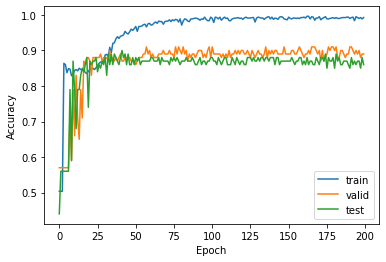

In [71]:
n_data = train.shape[0]

n_epochs = 200
batch_size = 10
learning_rate_value = 0.05

accuracies = {}

accuracies['train'] = []
accuracies['valid'] = []
accuracies['test'] = []
datasets = (train, valid, test)

### BEGIN SOLUTION
for i, key in enumerate(accuracies.keys()):
  params = init_mlp(2, 2, 1)
  accuracies[key] = train_model(params, datasets[i], learning_rate_value, n_epochs, batch_size)
### END SOLUTION

plt.figure()
for split, v in accuracies.items():
    plt.plot(v, label=split)

plt.legend(loc='best')
plt.ylabel('Accuracy')
plt.xlabel('Epoch');

### Visualization of the model parameters

For pedagogical reasons we will now visualize the parameters of the model with its geometrical interpretation.
We will represent the parameters of the first layer of the MLP as a line (the decision boundary).

In [72]:
def plot_decision_boundaries(w, b, ax=None, **kwargs):
    ax = ax or plt.gca()
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    
    arts = []
    for i in range(w.shape[1]):
        w_i = w[:, i]
        if len(b.shape)==1:
            b_i = b[i]
        else:
            b_i = b[:, i]
        
        intersections = []
        
        if w_i[1] != 0:
            yx0 = -w_i[0]/w_i[1] * x0 - b_i/w_i[1]
            yx1 = -w_i[0]/w_i[1] * x1 - b_i/w_i[1]
            
            if y0 <= yx0 <= y1:
                intersections.append((x0, yx0))
            
            if y0 <= yx1 <= y1:
                intersections.append((x1, yx1))
            
        if w_i[0] != 0:
            xy0 = -w_i[1]/w_i[0] * y0 - b_i/w_i[0]
            xy1 = -w_i[1]/w_i[0] * y1 - b_i/w_i[0]
            
            if x0 <= xy0 <= x1:
                intersections.append((xy0, y0))
            
            if x0 <= xy1 <= x1:
                intersections.append((xy1, y1))

        if len(intersections) == 2:
            xs, ys = zip(*intersections)
            lines, = ax.plot(xs, ys, **kwargs)
        
            arts.append(lines)
    
    ax.set_xlim([x0, x1])
    ax.set_ylim([y0, y1])
    
    return arts
        
def plot_model_and_data(params, dat=None, sel=None, ax=None):
    w, b, _, _ = params
    ax = ax or plt.gca()
    ax.set_prop_cycle(None)
    prop_cycle = ax._get_patches_for_fill.prop_cycler

    import itertools
    props = list(itertools.islice(prop_cycle, 3))
    
    all_arts = []
    
    if dat is not None:
        arts = ax.scatter(dat[dat[:,-1]==1,0], dat[dat[:,-1]==1,1], 
                            facecolors='none', edgecolors=props[0]['color'], alpha=0.2)
        all_arts.append(arts)

        arts = ax.scatter(dat[dat[:,-1]==0,0], dat[dat[:,-1]==0,1], 
                            facecolors='none', edgecolors=props[1]['color'], alpha=0.2)
        all_arts.append(arts)
    
    if sel is not None:
        arts = ax.scatter(sel[sel[:,-1]==1,0], sel[sel[:,-1]==1,1], 
                            facecolors=props[0]['color'], edgecolors=props[0]['color'])
        all_arts.append(arts)

        arts = ax.scatter(sel[sel[:,-1]==0,0], sel[sel[:,-1]==0,1], 
                            facecolors=props[1]['color'], edgecolors=props[1]['color'])
        all_arts.append(arts)
    
    line_arts = plot_decision_boundaries(w.detach().numpy(), b.detach().numpy(),
                             ax=ax,
                             color=props[2]['color'],
                             linewidth=2.0)
    all_arts += line_arts
    
    return all_arts

You can use the two functions created above to visualize a learning animation. You simply get the value returned by the function `plot_model_and_data(params, sel=train, ax=ax)` after each epoch. 

```
art = plot_model_and_data(params, sel=train, ax=ax)
arts.append(art)
``` 

## Exercise 20
Visualise the decision boundaries during a training procedure.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


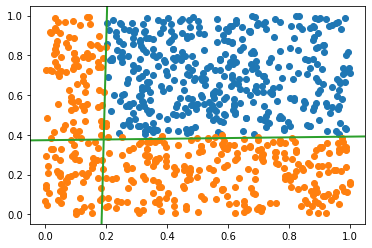

In [73]:
n_data = train.shape[0]

n_epochs = 250
batch_size = 10
learning_rate_value = 0.05 
n_iterations = n_data // batch_size # floor division
arts = []
fig, ax = plt.subplots()

### BEGIN SOLUTION
params = init_mlp(2, 2, 1)
for epoch in range(n_epochs):
  # Randomly reorder the `train` data (use `torch.randperm()`)
  data = train[torch.randperm(n_data)]
  art = plot_model_and_data(params, sel=data, ax=ax)
  arts.append(art)
  for iteration in range(n_iterations):
    # 1. Select a block of `batch_size` examples
    batch_data = data[iteration*batch_size:iteration*batch_size+batch_size]
    # 2. Run the forward pass on the model
    estimated = mlp(batch_data[:,:2],params)
    # 3. Compute the error
    loss = bce(estimated, batch_data[:,2:])
    # 4. Zero the gradients of each of the parameters because .bacward() accumulates them
            
    # 5. Compute the gradients
    loss.backward()
            
    # 6. Update the parameters using their gradients
    with torch.no_grad():
      for param in params:
        param.data -= learning_rate_value * param.grad.data

    # We need to zero the gradients at the end and of course not before calling the backward()
    for param in params:
      param.grad.data.zero_()
    ### END SOLUTION 
### END SOLUTION

anim = animation.ArtistAnimation(fig, arts, interval=50, repeat_delay=3000, blit=True);
HTML(anim.to_jshtml())

## [Optional] Exercise 21

Implement another (or all) alternative optimizers that we have seen in the lecture. Plot the loss curves of them on a same plot together with vanilla SGD.

In [74]:
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16, mom='SGD', verbose=False):
    losses = []

    ### BEGIN SOLUTION
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    ghama = 0.9
    
    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        # initialize the loss for each epoch
        losses.append(0)
        # Randomly reorder the `train` data (use `torch.randperm()`)
        data = data[torch.randperm(n_data)]
        ### END SOLUTION    
        m = [0,0,0,0]
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            # 1. Select a block of `batch_size` examples
            batch_data = data[iteration*batch_size:iteration*batch_size+batch_size]
            # 2. Run the forward pass on the model
            estimated = mlp(batch_data[:,:2],params)
            # 3. Compute the error
            loss = bce(estimated, batch_data[:,2:])
            losses[epoch] += loss.item()
            # 4. Zero the gradients of each of the parameters because .bacward() accumulates them
            
            # 5. Compute the gradients
            loss.backward()
            # 6. Update the parameters using their gradients
            with torch.no_grad():
              for i, param in enumerate(params):
                if mom == 'SGD with momentum':
                  param.data -= ghama*m[i] + eta * param.grad.data
                  m[i] = ghama*m[i] + eta * param.grad.data
                else:
                  param.data -= eta * param.grad.data

            # We need to zero the gradients at the end and of course not before calling the backward()
            for param in params:
              param.grad.data.zero_()
            ### END SOLUTION
        losses[epoch] /= (n_iterations*batch_size)  
    ### END SOLUTION
    return losses

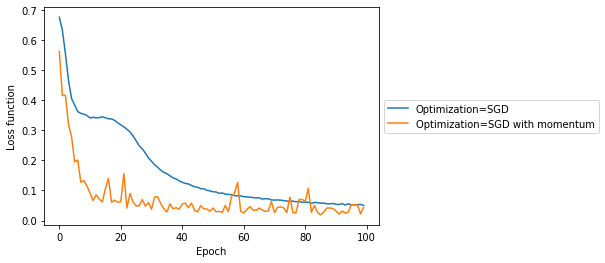

In [75]:
losses = {}
optm = ['SGD','SGD with momentum']
### BEGIN SOLUTION
for opt in optm:
  params = init_mlp(2, 2, 1)
  losses[opt] = train_model(params, train, eta=0.05, n_epochs=100, mom=opt)
### END SOLUTION

# Visualiser les courbes de cout
plt.figure()
for opt, loss_curve in losses.items():
    plt.plot(loss_curve, label=f'Optimization={opt}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');